<a href="https://colab.research.google.com/github/MatheusOrange211/Analise-Imunizacao-Brasil/blob/main/Projeto2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**ANÁLISE DE DADOS DO PROGRAMA DE IMUNIZAÇÃO NACIONAL**


## Resumo:
>Olá, sou Matheus Naranjo Corrêa, aluno do curso de Ciências da Computação e estudante do bootcamp de análise de dados da Alura Cursos Online de Tecnologia. O seguinte projeto visa realizar, de maneira superficial, um estudo a cerca do **Programa de Imunização Nacional (PNI)**, mais especificamente, sobre o desempenho do programa ao longo dos **últimos 27 anos**. <br>Iremos buscaremos entender como vem sendo o trabalho do Brasil na questão de imunização da população de doenças, dado que a vacinação é de suma importância para a manutenção da **saúde pública**, pois visa proteger não apenas o indivíduos que a toma, como também toda a sociedade, em especial crianças pequenas e idosos, grupo que mais propenso a se infectar com certas doenças e que podem acabar tendo complicações sérias.<br>
Com o auxílio da **ciência de dados**, vamos manipular dados brutos oriundos diretamente do portal do **Ministério da Sáude** e de demais locais que possam contribuir para o desenvolvimento. Para realizar as manipulações, utilizaremos a linguagem **Python** e suas bibliotecas mais famosas para análise de dados, **Pandas** e **Numpy**, além de bibliotecas gráficas que auxiliarão para um melhor entendimento visual dos estudos, como o **Matplotlib** e **Seaborn**. Contudo, se necessário, adicionaremos outras se forem necessário.

## Análise dos dados:

> Para maiores informações a respeito dos dados das tabelas que estamos utilizando, por favor, clique [aqui](http://tabnet.datasus.gov.br/cgi/pni/cpnidescr.htm#:~:text=A%20f%C3%B3rmula%20de%20c%C3%A1lculo%20da,de%20menores%20de%201%20ano.). <br>
Todos os dados utilizados na análise foram retirados do site [DATASUS](http://tabnet.datasus.gov.br).

Em nosso projeto analisaremos os dados buscando encontrar algumas resposta para as seguintes perguntas:
* Comportamento da cobertura vacinal ao longo dos anos

>Importando  as bibliotecas que iremos utilizar

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import ticker
from matplotlib.offsetbox import AnchoredText
from io import StringIO
import folium
from folium.plugins import MarkerCluster

##Funções que usaremos

In [ ]:
#função que converter os valores de uma coluna para float, removendo a virgula e 
#deixando em ponto, padrão.
def converter_df_float(data_usada):
  for i in data_usada.columns[1:]:
    data_usada[i] = data_usada[i].str.replace(',','.')
    data_usada[i] = pd.to_numeric(data_usada[i])
  return data_usada

In [ ]:
#Função mudar cor da tabela de acordo com o nível de cobertura Vacinal
def cobertura_acima(s):
  valores = s
  res = 'background-color: #06d6a0' if s >100\
         else  'background-color: #43aa8b' if s <= 100 and s>=90\
         else  'background-color: #90be6d' if s <90 and s>=80\
         else  'background-color: #f9c74f' if s <80 and s>=70\
         else  'background-color: #f8961e' if s <70 and s>=60\
         else  'background-color: #f3722c' if s < 60 and s>=50\
         else  'background-color: #f94144' if s < 50 else '' 
  return res

In [ ]:
#função usada para converter alguma variavel que contenha uma tabela copiada de algum site
def polio_convert_data(data_used):
  data_used_io = StringIO(data_used)
  data_used_io = pd.read_csv(data_used_io,sep='\t')
  return data_used_io

In [ ]:
#Esta função funciona para realizar a limpeza de colunas que não usaremos como 
#também para formatar
def converter_dados_polio(dados_polio,coluna_drop,coluna_index,coluna_codigo):
  dados_polio = dados_polio[:-1]
  dados_polio = dados_polio.drop(columns=f'{coluna_drop}',axis=1)
  dados_polio = dados_polio.set_index(f'{coluna_index}')
  dados_polio[f'{coluna_codigo}']= dados_polio.index.str[:6]
  dados_polio.index = dados_polio.index.str[7:]
  return dados_polio

In [ ]:
#Esta função funciona para combinar os dados de mapa com o dataset da poliomielite de 2018
def combinar_mapa_polio(dados_polio : pd.DataFrame, dados_mapa: pd.DataFrame):
  dados_polio = dados_polio.reset_index('municipio')
  dados_polio = dados_polio.set_index('cod_municipio')
  dados_mapa = dados_mapa.set_index('cod_municipio')
  novo_df  = dados_polio.join(dados_mapa,lsuffix='_left')
  novo_df = novo_df.drop(columns=['municipio_left'],axis=1)
  novo_df = novo_df.dropna(how='any')
  return novo_df


##Nosso dados

Importando dados GEOjson

In [ ]:
MN_dados_geo = pd.read_csv('https://raw.githubusercontent.com/gustavopierre/data_science_portfolio/master/municipios_coord.csv',sep=';')
MN_dados_geo = MN_dados_geo.rename(columns={"GEOCODIGO_MUNICIPIO":"cod_municipio","NOME_MUNICIPIO":"municipio","LONGITUDE":"longitude","LATITUDE":"latitude"})
MN_dados_geo['cod_municipio'] = MN_dados_geo['cod_municipio'].str[:6]
MN_dados_geo = MN_dados_geo.dropna(how='any')
MN_dados_geo

,cod_municipio,municipio,longitude,latitude
0,110001,ALTA FLORESTA D'OESTE,-61.999824,-11.935540
1,110002,ARIQUEMES,-63.033269,-9.908463
2,110003,CABIXI,-60.544314,-13.499763
3,110004,CACOAL,-61.442944,-11.433865
4,110005,CEREJEIRAS,-60.818426,-13.195033
...,...,...,...,...
5560,522200,VIANÓPOLIS,-48.513471,-16.742081
5561,522205,VICENTINÓPOLIS,-49.807239,-17.732662
5562,522220,VILA BOA,-47.057361,-15.034889
5563,522230,VILA PROPÍCIO,-48.882422,-15.454635


>Importando dados referentes a Coberturas Vacinais por Unidade da Federação e Ano (1997-2019)

In [ ]:
dados_cobertura_UF = pd.read_csv('https://github.com/MatheusOrange211/Analise-Imunizacao-Brasil/raw/main/dados_de_imunizacao/dados_cobertura/cpnibr16066149571.csv',
                                 encoding='ISO-8859-1',sep=';')

dados_cobertura_UF = converter_df_float(dados_cobertura_UF)
dados_cobertura_UF =dados_cobertura_UF.set_index('Unidade da Federação')
dados_cobertura_UF = dados_cobertura_UF.drop('Total')
dados_cobertura_UF = dados_cobertura_UF.drop(columns=[' Total'],axis=1)

dados_cobertura_UF.head()

,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,
11 Rondônia,83.33,93.26,82.31,79.59,83.70,78.18,72.30,84.61,80.75,84.44,86.21,82.39,83.87,79.26,92.75,85.82,76.72,98.18,111.27,63.77,85.05,82.92,82.12,68.20
12 Acre,67.56,66.38,85.61,66.79,76.77,81.66,77.54,83.10,72.09,70.66,80.54,75.06,79.18,76.32,84.74,74.35,58.87,59.29,75.54,46.91,63.56,69.84,74.83,49.45
13 Amazonas,72.01,70.62,72.19,70.91,70.68,70.98,64.77,74.57,73.67,74.81,78.84,76.40,78.63,73.30,80.09,79.18,67.06,77.14,94.95,48.27,71.14,75.22,79.80,59.50
14 Roraima,80.26,97.45,93.76,83.94,72.67,78.33,72.99,83.23,78.26,74.22,76.90,71.13,80.21,75.19,84.42,73.13,60.70,82.30,105.27,57.41,89.16,83.50,77.48,54.96
15 Pará,67.09,67.46,82.95,77.23,83.43,82.66,80.50,100.63,89.24,86.99,87.91,84.70,84.04,81.55,84.11,77.87,67.91,71.71,67.51,41.43,57.38,60.48,65.14,47.07


>Importando os dados referentes as Doses Calculos CV por Ano segundo Unidade da Federação

In [ ]:
dados_doses_calculos = pd.read_csv('https://github.com/MatheusOrange211/Analise-Imunizacao-Brasil/raw/main/dados_de_imunizacao/dados_cobertura/Doses%20Calculos%20CV%20por%20Ano%20segundo%20Unidade%20da%20Federacao.csv',
                                 encoding='ISO-8859-1',sep=';')
dados_doses_calculos = dados_doses_calculos.set_index('Unidade da Federação')
dados_doses_calculos = dados_doses_calculos.drop([' Total'],axis=1)
dados_doses_calculos.head()

,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,
11 Rondônia,221136,254228,511993,595405,634672,603409,567875,732052,698279,702254,671022,670070,681503,647582,435345,427785,487788,664623,692060,619782,490277,464224,472702,359422
12 Acre,78576,79331,240690,245193,281863,309201,300787,378766,353552,349014,386861,379638,390602,375827,257132,240469,240916,254867,294119,259444,226433,233104,257688,156047
13 Amazonas,427850,430178,1013496,1198384,1327220,1360736,1270370,1581187,1613814,1685221,1704003,1647149,1703841,1658753,1090240,1149204,1173912,1546920,1721877,1404249,1199874,1212871,1309691,894292
14 Roraima,51558,64159,139177,187080,162704,171102,168107,220949,210400,207007,218408,203350,225293,216961,146403,134478,137917,223255,261569,223781,205714,192654,187129,121410
15 Pará,890749,914640,2585184,2886309,3182573,3209151,3183958,4313926,3928530,4003528,3997712,3856972,3699454,3535221,2159285,2120596,2217128,2577588,2121121,1986047,1736141,1772620,1922339,1272637


>Importando dados referentes a Taxa de abandono por Ano segundo Unidade Federacao

In [ ]:
dados_taxa_aband = pd.read_csv('https://github.com/MatheusOrange211/Analise-Imunizacao-Brasil/raw/main/dados_de_imunizacao/dados_taxa_abandono/Taxa%20de%20abandono%20por%20Ano%20segundo%20Unidade%20Federacao.csv',
                               encoding='ISO-8859-1',
                               sep=';')

dados_taxa_aband = converter_df_float(dados_taxa_aband)
dados_taxa_aband = dados_taxa_aband.drop([' Total'],axis=1)
dados_taxa_aband = dados_taxa_aband.set_index('Unidade Federação')
dados_taxa_aband.head()

,2015,2016,2017,2018,2019,2020
Unidade Federação,,,,,,
Acre,28.01,19.60,19.57,6.50,23.99,13.61
Alagoas,18.05,20.00,25.45,13.01,17.41,27.43
Amapá,30.91,18.78,27.30,24.59,27.09,35.31
Amazonas,16.40,15.49,18.31,22.53,26.38,20.62
Bahia,15.93,12.39,14.62,21.50,25.60,33.23


>importando dados referentes a População de cada Estado

In [ ]:
dados_populacao = pd.read_html("https://pt.wikipedia.org/wiki/Lista_de_unidades_federativas_do_Brasil_por_popula%C3%A7%C3%A3o")

dados_populacao = dados_populacao[0]
dados_populacao = dados_populacao.rename(columns={'Unidade federativa':'unidade federativa','População':'populacao'})
dados_populacao = dados_populacao[['unidade federativa','populacao']]
dados_populacao['populacao'] = dados_populacao['populacao'].str.replace(' ','')
dados_populacao['populacao'] = dados_populacao['populacao'].astype(int)

In [ ]:
dados_populacao.head()

,unidade federativa,populacao
0,São Paulo,46289333
1,Minas Gerais,21292666
2,Rio de Janeiro,17366189
3,Bahia,14930634
4,Paraná,11516840


Importando dados referentes as vacinas e suas referentes porcentagens de vacinação ao longo dos anos

In [ ]:
dados_imunos = pd.read_csv('https://github.com/MatheusOrange211/Analise-Imunizacao-Brasil/raw/main/dados_de_imunizacao/dados_cobertura/cpnibr16066156251.csv',
                           sep=';',
                           encoding='ISO-8859-1',
                           skipfooter=2,engine='python')

dados_imunos = dados_imunos.drop([' Total'],axis=1)
dados_imunos = converter_df_float(dados_imunos)
dados_imunos = dados_imunos.set_index('Imuno')
dados_imunos 

,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Imuno,,,,,,,,,,,,,,,,,,,,,,,,
BCG,117.12,111.61,117.28,111.74,112.60,110.28,108.47,113.36,114.48,113.06,111.08,108.91,108.71,106.71,107.94,105.69,107.42,107.28,105.08,95.55,97.98,99.72,86.67,64.71
Hepatite B em crianças até 30 dias,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,88.54,90.93,81.75,85.88,88.40,78.57,55.89
Rotavírus Humano,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,46.52,79.79,81.18,85.99,83.04,87.06,86.37,93.52,93.44,95.35,88.98,85.12,91.33,85.40,67.59
Meningococo C,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,26.88,105.66,96.18,99.70,96.36,98.19,91.68,87.44,88.49,87.41,68.17
Hepatite B,5.79,12.63,83.50,91.08,91.88,91.47,92.00,96.26,98.46,100.30,99.89,96.06,100.20,96.08,97.71,96.67,100.56,96.42,97.74,105.19,84.40,88.53,70.77,66.20
Penta,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,24.89,95.89,94.85,96.30,89.27,84.24,88.49,70.76,66.20
Pneumocócica,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,24.02,81.65,88.39,93.57,93.45,94.23,95.00,92.15,95.25,89.07,71.13
Poliomielite,89.27,95.30,99.08,101.44,102.83,100.01,100.48,104.30,105.12,105.25,105.43,100.18,103.66,99.35,101.33,96.55,100.71,96.76,98.29,84.43,84.74,89.54,84.19,65.30
Poliomielite 4 anos,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,62.26,63.62,68.45,57.12


Usando dados da poliomielite/AFP no brasil existentes no site da OMS

In [ ]:
dados_oms_polio = """
Year	Country / Territory / Region	AFP cases	Non polio AFP Rate	% Adequate Stool Collection	Pending	Wild poliovirus cases	cVDPV Cases	Compatibles	Footnotes
2000	Brazil	533	1.01	52	0	0	0	12	
2001	Brazil	674	1.28	64	0	0	0	6	
2002	Brazil	636	1.23	70	0	0	0	1	
2003	Brazil	654	1.26	74	0	0	0	2	
2004	Brazil	646	1.24	71	0	0	0	3	
2005	Brazil	609	1.11	74	0	0	0	0	
2006	Brazil	615	1.12	72	0	0	0	0	
2007	Brazil	635	1.16	77	0	0	0	0	
2008	Brazil	585	1.07	73	0	0	0	0	
2009	Brazil	548	1	77	0	0	0	0	
2010	Brazil	513	0.96	79	0	0	0	0	
2011	Brazil	561	1.05	77	0	0	0	1	
2012	Brazil	502	0.94	75	0	0	0	2	
2013	Brazil	434	0.81	70	0	0	0	0	
2014	Brazil	445	0.83	71	0	0	0	0	
2015	Brazil	485	0.89	73	0	0	0	0	
2016	Brazil	500	0.94	66	0	0	0	0	
2017	Brazil	486	0.91	70	0	0	0	1	
2018	Brazil	502	0.94	65	0	0	0	1	
2019	Brazil	448	0.84	65	0	0	0	1	
2020	Brazil	150	0.32	46	44	0	0	0	
"""
dados_oms_polio = polio_convert_data(dados_oms_polio)
dados_oms_polio = dados_oms_polio[['Year','AFP cases']]
dados_oms_polio = dados_oms_polio.rename(columns={"Year":"ano","AFP cases":"casos_AFP"})
dados_oms_polio

,ano,casos_AFP
0,2000,533
1,2001,674
2,2002,636
3,2003,654
4,2004,646
5,2005,609
6,2006,615
7,2007,635
8,2008,585
9,2009,548


Importando dados referentes a cobertura vacinal da poliomielite nos municípios em 2018

In [ ]:
dados_polio_2018 = pd.read_csv('https://github.com/MatheusOrange211/Analise-Imunizacao-Brasil/raw/main/dados_de_imunizacao/dados_especificos_polio/2018-cpnibr16066810824.csv',
                               sep=';',
                               encoding='ISO-8859-1',
                               engine='python')

dados_polio_2018 = dados_polio_2018.rename(columns={"Município":"municipio",
                                                    "Poliomielite":"poliomielite",
                                                    "Poliomielite 4 anos":"poliomielite_4_anos",
                                                    "GEOCODIGO_MUNICIPIO":"cod_municipio"})
dados_polio_2018 = converter_df_float(dados_polio_2018)
dados_polio_2018 = converter_dados_polio(dados_polio_2018,' Total','municipio','cod_municipio')

dados_polio_2018.head()

,poliomielite,poliomielite_4_anos,cod_municipio
municipio,,,
ALTA FLORESTA D\'OESTE,111.35,32.90,110001
ARIQUEMES,96.75,70.91,110002
CABIXI,209.59,109.78,110003
CACOAL,103.06,71.72,110004
CEREJEIRAS,104.94,100.82,110005


#ANÁLISE DOS DADOS

Vamos Analisar a distruibuição de cobertura vacinal em cada Unidade Federativa e buscar ver os estados que tiveram valor acima de 100 na cobertura vacinal, analisando pela própria tabela. Para isso temos que:
* Quanto menor for a cobertura vacinal, mais próximo do vermelho fica a célula
* Quanto maior for a cobertura vacinal, mais próximo do verde fica a célula.

Cobertura vacinal significa, conforme estudo disponível no scielo (clique [aqui](http://scielo.iec.gov.br/scielo.php?script=sci_arttext&pid=S1679-49742003000300005#:~:text=demais%20faixas%20et%C3%A1rias.-,A%20cobertura%20vacinal%20pode%20ser%20entendida%20como%20a%20propor%C3%A7%C3%A3o%20de,doses%20foram%20aplicadas%20nas%20idades) para ler), nas palavras dos próprios autores:<br>

>[...]Consideraremos a cobertura vacinal em menores de 1 ano; porém, os mesmos princípios aplicam-se às demais faixas etárias. A cobertura vacinal pode ser entendida como a proporção de crianças menores de um ano que receberam o esquema completo de vacinação em relação aos menores de 1 ano existentes na população, entendendo-se por esquema completo a aplicação de todas as vacinas preconizadas pelo PNI, cujas doses foram aplicadas nas idades corretas (adequação epidemiológica) e com os intervalos corretos (adequação imunológica).


Realizaremos a seguir, de maneira bruta, uma análise dos valores referente a tabela `dados_cobertura_UF`. Esta tabela contém valores referentes a cobertura vacinal de cada unidade federativa ao longo dos últimos 23 anos, e contempla o trabalho que cada ente federativo veio desempenhando durante as campanhas de vacinação.

In [ ]:
dados_cobertura_UF.style.set_table_attributes('class="dataframe"').applymap(cobertura_acima).set_precision(2)

,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,
11 Rondônia,83.33,93.26,82.31,79.59,83.70,78.18,72.30,84.61,80.75,84.44,86.21,82.39,83.87,79.26,92.75,85.82,76.72,98.18,111.27,63.77,85.05,82.92,82.12,68.20
12 Acre,67.56,66.38,85.61,66.79,76.77,81.66,77.54,83.10,72.09,70.66,80.54,75.06,79.18,76.32,84.74,74.35,58.87,59.29,75.54,46.91,63.56,69.84,74.83,49.45
13 Amazonas,72.01,70.62,72.19,70.91,70.68,70.98,64.77,74.57,73.67,74.81,78.84,76.40,78.63,73.30,80.09,79.18,67.06,77.14,94.95,48.27,71.14,75.22,79.80,59.50
14 Roraima,80.26,97.45,93.76,83.94,72.67,78.33,72.99,83.23,78.26,74.22,76.90,71.13,80.21,75.19,84.42,73.13,60.70,82.30,105.27,57.41,89.16,83.50,77.48,54.96
15 Pará,67.09,67.46,82.95,77.23,83.43,82.66,80.50,100.63,89.24,86.99,87.91,84.70,84.04,81.55,84.11,77.87,67.91,71.71,67.51,41.43,57.38,60.48,65.14,47.07
16 Amapá,52.06,73.77,83.48,70.61,101.50,75.61,76.13,87.86,81.02,76.09,76.76,74.15,84.31,75.31,77.88,73.77,67.66,76.11,88.75,56.62,57.89,63.76,69.27,34.63
17 Tocantins,56.24,86.73,87.82,80.63,87.42,80.88,75.39,82.22,78.77,78.68,81.82,79.53,81.54,75.12,87.78,76.34,72.78,85.09,92.37,60.94,77.95,81.12,82.12,69.94
21 Maranhão,60.33,68.09,81.10,74.81,79.09,76.93,75.58,85.53,83.50,82.76,87.34,83.65,84.62,87.04,87.15,77.67,73.54,83.27,94.40,43.38,64.39,68.11,63.23,42.30
22 Piauí,57.65,64.59,81.53,78.74,81.18,79.67,74.41,86.09,76.64,78.18,80.35,76.69,78.11,75.44,86.04,77.57,71.99,76.06,80.68,46.94,68.44,72.86,69.58,56.60


Esse dateset nos mostra a cobertura vacinal de cada ano, contudo, não vamos nos confundir aqui. O que está sendo mostrado para nós é o total, se pegarmos as médias de todas as vacinas que são aplicadas em cada estado ao longo dos anos. Contudo, ainda assim, temos uma questão curiosa a se analisar. Se pegarmos o ano de 2016 e 2020, temos que a cobertura nacional foi menor do que 50% em muitos estados. Pesquisando um pouco, encontramos esta matéria da [bbc](https://www.bbc.com/portuguese/brasil-41045273#:~:text=Em%202016%2C%20no%20entanto%2C%20o,de%20multivacina%C3%A7%C3%A3o%2C%20finalizada%20em%20setembro.), que diz que o país teve a menor taxa de vacinação da história para **Poliomielite**, ficando abaixo de 85%, sendo a meta de 95% **(Analisaremos mais abaixo)**. Esta matéria nos dá um indicador interessante a se analisar. Afinal, se em 2016 a vacinação da poliomielite foi baixa e a cobertura vacinal nos estados também foi baixa no mesmo ano, será que este comportamento pode ter ocorrido com outra vacinas?


# Como as taxas de vacinação se comportaram ao longo dos anos?

##Poliomielite
> **Público-Alvo**: Todas as crianças menores de cinco anos, a partir de dois meses de idade.<br>
**Quando se deve Tomar?** Aos dois, quatro e seis meses de idade, com reforço aos quinze meses. No Brasil, além disso, todas as crianças menores de cinco anos de idade devem receber a vacina nos dias de Campanha Nacional de Vacinação contra a Poliomielite, independentemente de já estarem com suas vacinas em dia.

Como vimos mais acima, o ano de 2016 e 2020 apresentam algumas coisas curiosas a se analisar. O dataset que usamos nos mostrava apenas a cobertura vacinal em cada estado ao longo dos anos, contudo não focava em uma vacina.Primeiramente, vamos analisar mais de perto o comportamento a taxa de vacinação pelos anos e verificar se em 2016 a poliomielite realmente ficou abaixo da meta estipulada e se isso se aplica para outras vacinas.<br>
Vamos entender um pouco sobre a doença. Segundo o site da Organização Pan-Americana da Saúde [OPAS/OMS BRASIL](https://www.paho.org/bra/index.php?option=com_content&view=article&id=5735:folha-informativa-poliomielite&Itemid=820), temos que a Poliomielite:

* A poliomielite afeta principalmente crianças com menos de cinco anos de idade.
* Uma em cada 200 infecções leva a uma paralisia irreversível (geralmente das pernas). Entre os acometidos, 5% a 10% morrem por paralisia dos músculos respiratórios.
* Os casos de poliomielite diminuíram mais de 99% nos últimos anos: dos 350 mil casos estimados em 1988 para 29 casos notificados em 2018.
* Enquanto houver uma criança infectada, crianças de todos os países correm o risco de contrair a poliomielite. Se a doença não for erradicada, podem ocorrer até 200 mil novos casos no mundo, a cada ano, dentro do período de uma década.
* Na maioria dos países, os esforços mundiais ampliaram as capacidades para combater outras doenças infecciosas, construindo sistemas eficazes de vigilância e imunização.<br>
Analisando o gráfico temos:

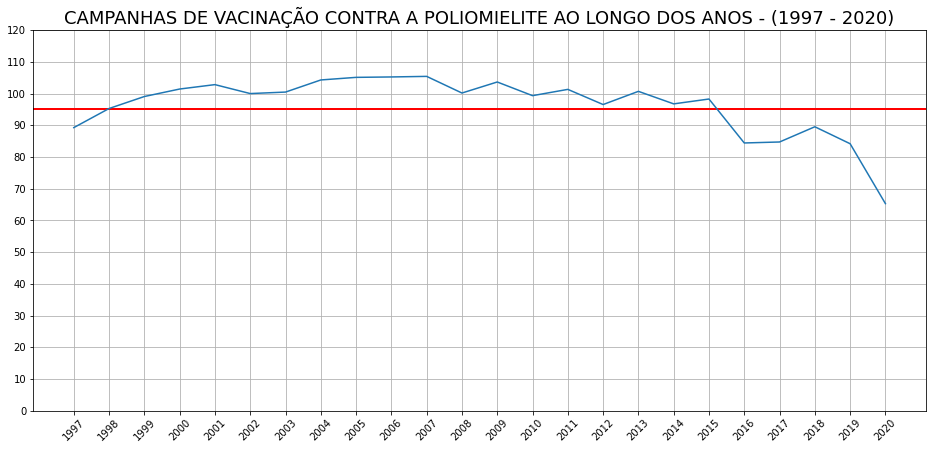

In [ ]:
poliomielite = dados_imunos.T
plt.figure(figsize=(16,7))
plt.axhline(y=95,color='red',linewidth = 2)
plt.plot(poliomielite['Poliomielite'])
plt.yticks(np.arange(0,130,10))
plt.grid()
plt.xticks(rotation=45)
plt.ylim(0,120)
plt.title("CAMPANHAS DE VACINAÇÃO CONTRA A POLIOMIELITE AO LONGO DOS ANOS - (1997 - 2020)",size=18)
plt.show()

Pelo que podemos analisar, no que tange a poliomelite que nos anos de 2016 em diante, ficou abaixo de 90%, sendo o ano 2020 o mais baixo da história até o momento (pegando de 1997-2020). Contudo, vale lembrar que os dados para este ano ainda podem sofrer alterações.
<br>Vale observar que a partir de 2007 o país passou por uma espécie de sobe e desce, mas sempre acima de 90%. Foi a partir de 2016 que notamos uma queda gigante que se manteve até o momento.<br> Segundo o [Informativo técnino do Minstério da Saúde](https://www.cevs.rs.gov.br/upload/arquivos/201807/31163732-informe-tecnico-campanha-nacional-de-vacinacao-contra-a-poliomielite-e-o-sarampo-2018.pdf), a meta para a Poliomelite era de 95%, contudo, naquele ano, conseguiram cerca de 89,54 % de cumprimento da meta, faltando ainda cerca de 5,46%. Note também que em em 1997 não se cumpriu a meta, ficando na casa dos 89,27%, já o ano de 1998 (95,30%) até 2015 (98,29%) as campanhas de vacinação obtiveram êxito.<br>
O brasil recebeu em 1994 a certificação de país que eliminou a poliomielite, conforme aponta o site da OPAS/OMS BRASIL, mas vale destacar que isso pode mudar pois a doença ainda não erradicada completamente do mundo.<br>É preocupante a questão da vacinação estar despecando nos últimos anos. A vice-presidente da Sociedade Brasileira de Imunizações (SBIm), [Isabela Ballalai](https://sbim.org.br/curriculos/17-redacao-e-revisao-dos-sites/758-isabella-ballalai), destaca que :

>Sem a adesão mínima de 95%, o País fica em uma situação vulnerável. A poliomielite já foi catástrofe e estamos deixando correr o risco de que ela volte. É uma doença com uma grande taxa de complicação e que leva a sequelas traumáticas. Temos muitos testemunhos de pessoas que foram vítimas na infância e que hoje precisam usar cadeira de rodas ou respirar com auxílio de traqueostomia. ([UOL](https://www.uol.com.br/vivabem/noticias/redacao/2020/10/30/vacina-contra-polio-tem-baixa-adesao-e-risco-da-doenca-volta-a-assustar.htm?cmpid=copiaecola))

Umas das consequências causadas pela não vacinação contra a poliomielite é a **Paralisia Flácido Aguda** ou **AFP (em Inglês)**. É  definida pelo aparecimento agudo de fraqueza ou paralisia com tônus muscular reduzido em crianças. Segundo o site da [National Institute for Communicable Diseases](https://www.nicd.ac.za/diseases-a-z-index/acute-flaccid-paralysis-afp/#:~:text=Acute%20Flaccid%20Paralysis%20or%20AFP,non%2Dinfectious%20causes%20of%20AFP.):
> Há muitas causas infecciosas e não infecciosas da AFP. A poliomielite, causada pelo poliovírus selvagem (a cepa natural que circula) é uma das causas da AFP. Em consonância com a campanha mundial para erradicar a poliomielite, há um processo global de monitoramento onde casos clínicos da AFP são identificados e investigados para descrever se esses casos são resultado direto do poliovírus selvagem. (*traduzido*) <br>

E vem a pergunta então, como estão os casos da doença? <br>Vamos analisar os dados vindo diretamente do site da [OMS](https://extranet.who.int/polis/public/CaseCount.aspx)

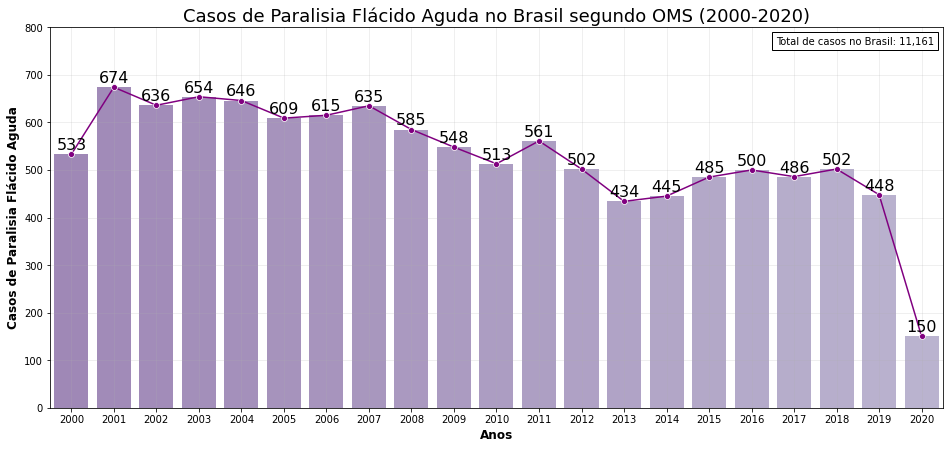

In [ ]:
#Definimos o primeiro plot que será de linha (ax1)
ax1 = sns.set_style(style=None, rc=None )
fig,ax1  =  plt.subplots(figsize=(16,7))
sns.lineplot(data = dados_oms_polio['casos_AFP'],color='purple',marker='o',ax=ax1)


#Definimos que o próximo plot receberá o ax1 que está com as informações do gráfico de linha salvo. Com os valores de alpha em .5, deixamos mais 
#esbranquiçado nosso plot de barras, sendo possível verificar melhor os dois gráficos
ancora = AnchoredText(f"Total de casos no Brasil: {dados_oms_polio['casos_AFP'].sum():,.0f}",loc='upper right',borderpad= .5)

grafico_polio_oms = sns.barplot(data= dados_oms_polio ,x='ano',y='casos_AFP',
                                palette= sns.color_palette('Purples_r',(len(dados_oms_polio['ano'])+50)),
                                alpha=0.5,
                                ax=ax1)

grafico_polio_oms.add_artist(ancora)

for p in grafico_polio_oms.patches:
  grafico_polio_oms.annotate(format(p.get_height(),'.0f'),
                             (p.get_x() + p.get_width()/2, p.get_height()),
                             ha='center',va='center',
                             size=16,
                             xytext=(0,9),
                             textcoords='offset points')


plt.grid(alpha=0.25)
plt.title('Casos de Paralisia Flácido Aguda no Brasil segundo OMS (2000-2020)',size=18)
plt.ylim(0,800)
plt.ylabel('')
plt.ylabel('Casos de Paralisia Flácido Aguda',size=12,weight='bold')
plt.xlabel('Anos',size=12, weight='bold')
plt.show()

Os casos não passaram de 700 ao longo dos 20 anos, o que pode nos levar a crer que a implementação das vacinas seja responsável por tal feito. Observe que nos anos em que o Brasil passou da meta estipulada, foram também, em sua grande maioria, anos com mais casos e nos anos em que ficou abaixo da meta de vacinação, os casos de Paralisia Flácido Aguda foram mais baixos. Podemos nos enganar com estes números se não levarmos em conta os avanços do sistema de saúde como um todo, em especial, ao público mais jovem (até os 15 anos). Os trabalhos desempenhados ao longo dos anos nos levam a crer que tais casos vem caindo por conta do melhor preparo existente nos tempos atuais nos postos de saúde.

Vamos agora analisar a questão dos municípios. Ver como Foi a cobertura vacinal contra a poliomielite. Usaremos um dataset que possui 2 colunas que tratam da poliomielite. Cada vacinação tem estratégias diferenciadas para as crianças menores de um ano e para aquelas na faixa etária de 1 a 4 anos de idade, podendo ser Vacina Oral Poliomielite (VOP) ou Vacina Inativada Poliomielite (VIP). Analisaremos os 3 últimos anos (2018,2019,2020) e veremos como está o comportamento nos municípios brasileiros.

In [ ]:
# teste1 = dados_polio_2018
# teste2 = MN_dados_geo


In [ ]:
dados_polio2018_mapa = combinar_mapa_polio(dados_polio_2018,MN_dados_geo)
dados_polio2018_mapa

,poliomielite,poliomielite_4_anos,municipio,longitude,latitude
cod_municipio,,,,,
110001,111.35,32.90,ALTA FLORESTA D'OESTE,-61.999824,-11.935540
110002,96.75,70.91,ARIQUEMES,-63.033269,-9.908463
110003,209.59,109.78,CABIXI,-60.544314,-13.499763
110004,103.06,71.72,CACOAL,-61.442944,-11.433865
110005,104.94,100.82,CEREJEIRAS,-60.818426,-13.195033
...,...,...,...,...,...
522200,115.98,66.13,VIANÓPOLIS,-48.513471,-16.742081
522205,114.15,41.03,VICENTINÓPOLIS,-49.807239,-17.732662
522220,76.27,49.48,VILA BOA,-47.057361,-15.034889


In [ ]:
map = folium.Map(
    location = [dados_polio2018_mapa['latitude'].mean(),dados_polio2018_mapa['longitude'].mean()],
    tiles ='OpenStreetMap',
    zoom_start =4
)
marker_cluster = MarkerCluster().add_to(map)


for _, municipio in dados_polio2018_mapa.iterrows():
    if municipio['poliomielite'] >= 90:
        color = 'green'
    elif 90 < municipio['poliomielite'] >=60:
        color ='orange'
    else:
        color = 'red'
        
    
  
    folium.Marker(
        location=[municipio['latitude'], municipio['longitude']],
        popup="<left>{}</left><br><center>Cobertura:{}%</center><br>".format(
            municipio['municipio'], municipio['poliomielite']),
        icon=folium.Icon(color=color)
    ).add_to(marker_cluster)
map


##SARAMPO

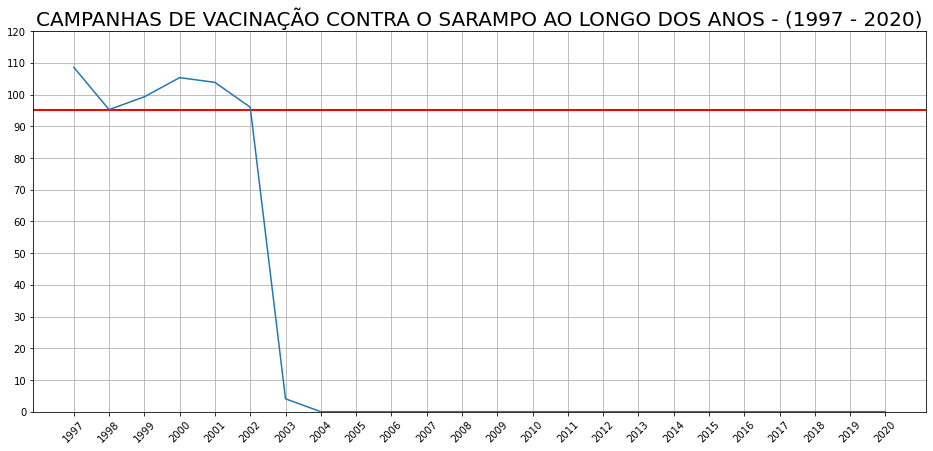

In [ ]:
sarampo = dados_imunos.T
plt.figure(figsize=(16,7))
plt.axhline(y=95,color='red',linewidth = 2)
plt.plot(sarampo['Sarampo'])
plt.yticks(np.arange(0,130,10))
plt.grid()
plt.xticks(rotation=45)
plt.ylim(0,120)
plt.title("CAMPANHAS DE VACINAÇÃO CONTRA O SARAMPO AO LONGO DOS ANOS - (1997 - 2020)",size=20)
plt.show()

#MAPAS

>Facemos a análise dos dados referente a cobertura vacinal. Buscando entender como vem sendo a distribuição ao longo dos anos em cada Unidade Federativa

In [ ]:
m = folium.Map(location=[2.7992907, -60.7330566])
m

In [ ]:
m = folium.Map(
    location=[2.7992907, -60.7330566],
    zoom_start=12,
    tiles='Stamen Terrain'
)

tooltip = 'Click me!'

folium.Marker([2.7992907, -60.7330566], popup='<i>Mt. Hood Meadows</i>', tooltip=tooltip).add_to(m)
folium.Marker([2.8050424,-60.7392409], popup='<b>Timberline Lodge</b>', tooltip=tooltip).add_to(m)

m